In [1]:
import colour_scheme as cs
import importlib
importlib.reload(cs)

import scanpy as sc
sc.settings.set_figure_params(dpi=100, fontsize=10, dpi_save=250, format='pdf')
import numpy as np
import pandas as pd
from scipy import io
from matplotlib.pyplot import rc_context
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings(action='ignore')
from pathlib import Path

%matplotlib inline
import sys
sys.path.append('/links/groups/treutlein/USERS/zhisong_he/Work/brain_organoid_atlas/ext/')
import codes.py_wknn as wknn

path_fig = ''
path_data = ''
sc.settings.figdir = path_fig
sc.settings.set_figure_params(dpi=100, fontsize=10, dpi_save=350, format='.png')

# Reproducibility screen

In [2]:
braun = sc.read_h5ad(Path(path_data)/'preprint_cellranger/braun_2022_fetal_brain_v2_RG_subset.h5ad')
umap = pd.read_csv(Path(path_data)/"braun_RG_umap.tsv", sep='\t')
braun.obsm['X_umap_RG'] = umap.values
braun

AnnData object with n_obs × n_vars = 518030 × 33538
    obs: 'Age', 'CellClass', 'CellCycleFraction', 'CellID', 'Chemistry', 'Clusters', 'Donor', 'DoubletFlag', 'DoubletScore', 'Region', 'SampleID', 'Sex', 'Subdivision', 'Subregion', 'Tissue', 'TopLevelCluster', 'TotalUMIs', 'log_num_wknn_scanvi_q2r', 'cov_score', 'log_num_wknn_scanvi_q2r_ds_max', 'observed', 'leiden_scvi_res_1', 'leiden_scvi_res_2', 'leiden_scvi_res_10', 'log_num_wknn_rss_q2r_ds_max', 'observed_rss', 'leiden_rss_res_1', 'leiden_rss_res_2', 'leiden_rss_res_10', 'coex_score', 'matching_score', 'log_num_wknn_scanvi_q2r_hb', 'log_num_wknn_scanvi_q2r_hb_ds_max', 'Subregion2', 'neuron_ntt_label', 'gaus_scanvi_q2r', 'dist_scanvi_q2r', 'gaus_scanvi_q2r_sm', 'gaus_scanvi_q2r_ds_max', 'neuron_ntt_label_only'
    var: 'Accession', 'Chromosome', 'End', 'Gene', 'Start', 'Strand'
    uns: 'Donor_colors', 'Subregion_colors', 'leiden', 'leiden_rss_res_1_colors', 'leiden_rss_res_2_colors', 'log1p', 'matching_score_colors', 'neighbors'

In [5]:
adata = sc.read_h5ad(Path(path_data)/'exp1_processed_5_1.h5ad')
adata

AnnData object with n_obs × n_vars = 214059 × 4347
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'lib', 'original_name', 'condition\xa0_x', 'condition\xa0_y', 'condition_name_full', 'cell_line_1', 'cell_line_2', 'batch', 'medium', 'morphogen', 'morphogen_full', 'Batch_Medium', 'medium_morphogen', 'leiden', 'cell_class_v1', 'region_v1', 'fullname_v1', 'cell_line_pool', 'line_medium', 'iPSC_prob_max', 'iPSC_best_singlet', 'ESC_prob_max', 'ESC_best_singlet', 'cell_line', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.1', 'best_class', 'best_score_class', 'best_NT', 'best_score_NT', 'best_region', 'fullname_v3', 'doublet_score', 'predicted_doublet', 'fullname_v4'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'RNA_snn_res.1_colors', 'batch_colors', 'best_NT_colors', 'best_class_colors', 'best_region_colors

In [12]:
lat_rep_query = np.load(Path(path_data)/'mapping_braun_100/lat_rep_query.npy')
adata.obsm['X_scanvi_braun'] = lat_rep_query.copy()
adata.obs['medium_morphogen'].unique()

['Ctrl_NIM', 'SHH_A_NIM', 'SHH_E_NIM', 'RA_A_NIM', 'RA_E_NIM', ..., 'FGF8_late_A_NPM', 'FGF8_late_E_NPM', 'CHIR_tA_NPM', 'CHIR_tC_NPM', 'CHIR_tE_NPM']
Length: 24
Categories (24, object): ['CHIR_A_NIM', 'CHIR_A_NPM', 'CHIR_E_NIM', 'CHIR_E_NPM', ..., 'SHH_A_NIM', 'SHH_A_NPM', 'SHH_E_NIM', 'SHH_E_NPM']

In [ ]:
wknn_q2r = wknn.get_wknn(ref = braun.obsm['X_scvi'],
                         query = adata.obsm['X_scanvi_braun'],
                         k = 50,
                         query2ref = True,
                         ref2query = False,
                         weighting_scheme = "jaccard_square")



presence_scores_ct = wknn.estimate_presence_score(ref_adata=braun,
                                                  query_adata=adata,
                                                  wknn = wknn_q2r,
                                                  k_wknn=50,
                                                  use_rep_ref_wknn = 'X_scvi',
                                                  use_rep_query_wknn = 'X_scanvi_braun',
                                                  split_by='medium_morphogen', 
                                                 )





braun.obs = pd.concat([braun.obs, presence_scores_ct['per_group']], axis=1)


In [18]:
braun.obs['presence_max_Parse_morphogen'] = presence_scores_ct['max']
import re
braun.obs['presence_max_ctrl'] = presence_scores_ct['per_group'].loc[:,['Ctrl_NIM','Ctrl_NPM']].max(axis=1)
braun.obs['presence_max_treatment'] = presence_scores_ct['per_group'][np.setdiff1d(presence_scores_ct['per_group'].columns, ['Ctrl_NIM','Ctrl_NPM'])].max(axis=1)

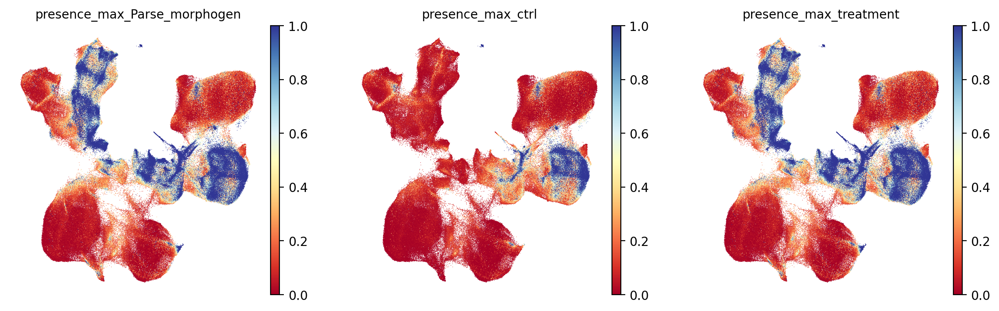

In [26]:
fig, ax = plt.subplots(1,3,figsize=(14,4))
sc.pl.embedding(braun, basis='X_umap_RG', color=['presence_max_Parse_morphogen'], frameon=False, color_map='RdYlBu', ax=ax[0], show=False, size=0.8)
sc.pl.embedding(braun, basis='X_umap_RG', color=['presence_max_ctrl'], frameon=False, color_map='RdYlBu', ax=ax[1], show=False, size=0.8)
sc.pl.embedding(braun, basis='X_umap_RG', color=['presence_max_treatment'], frameon=False, color_map='RdYlBu', ax=ax[2], show=False, size=0.8)
fig.show()


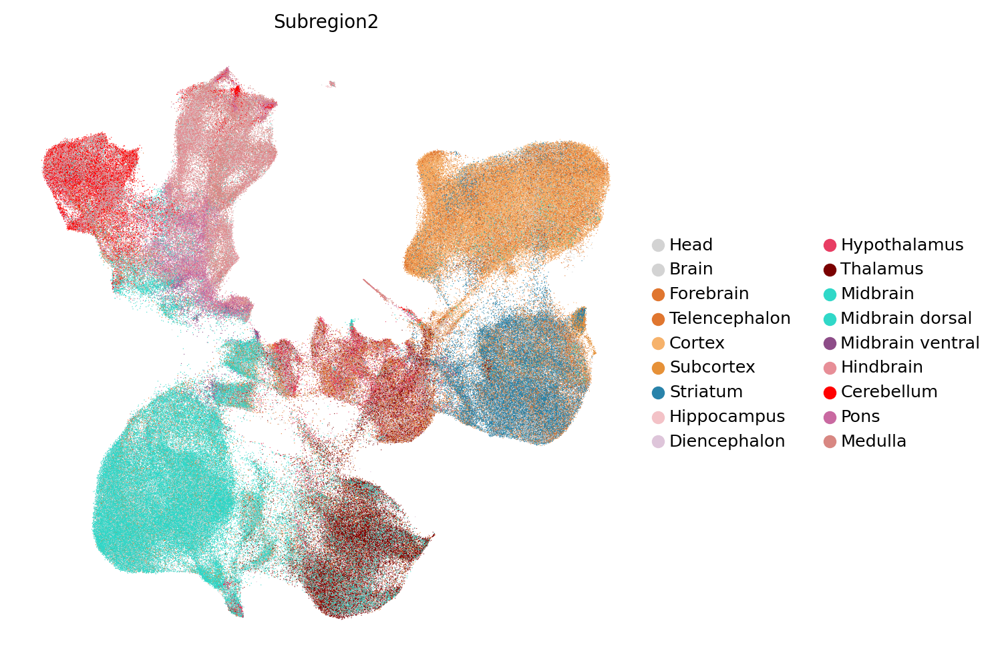

In [69]:
subregion_color = {'Cortex':'#f6b26b',
                 'Thalamus': '#7A0000',
                 'Midbrain ventral':'#8d4c88',
                 'Subcortex':'#e69138',
                 'Forebrain':'#e0762f',
                 'Hypothalamus':'#e83d63',
                 'Medulla':"#d88782",
                 'Striatum':'#2983aa',
                 'Midbrain':'#30d8c8',
                 'Telencephalon':'#e0762f',
                 'Pons':"#c969a1",
                 'Hippocampus':'#f3c2c7',
                 'Midbrain dorsal':'#30d8c8',
                 'Brain':'lightgray',
                 'Hindbrain':'#e78e97',
                 'Head':'lightgray',
                 'Diencephalon':"#dec5da",
                 'Cerebellum':'red'
                }


with plt.rc_context({'figure.figsize' : (6,6)}):
    sc.pl.embedding(braun, basis='X_umap_RG', color=[ 'Subregion2'
                                                  ], frameon=False,ncols=2, s=0.8,palette=subregion_color, save='subregion_RG_Braun.png')


In [29]:
braun.obs['presence_max_NIM'] = presence_scores_ct['per_group'].filter(regex='_NIM$').max(axis=1)
import re
braun.obs['presence_max_ctrl_NIM'] = presence_scores_ct['per_group'].loc[:,['Ctrl_NIM']]
braun.obs['presence_max_treatment_NIM'] = presence_scores_ct['per_group'][np.setdiff1d(presence_scores_ct['per_group'].filter(regex='_NIM$').columns, ['Ctrl_NIM'])].max(axis=1)

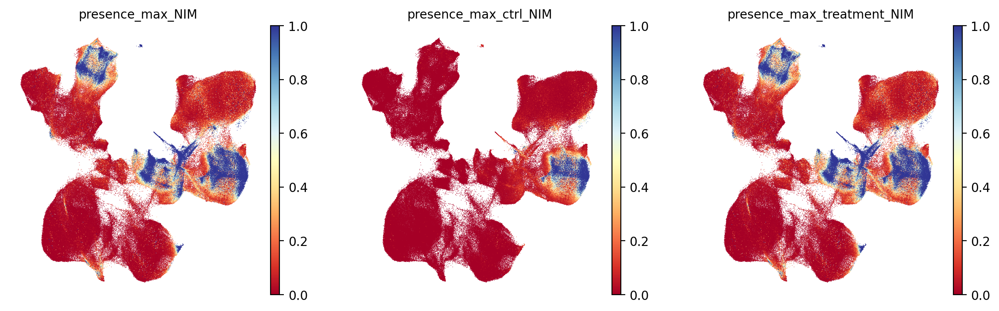

In [35]:
fig, ax = plt.subplots(1,3,figsize=(14,4))
sc.pl.embedding(braun, basis='X_umap_RG', color=['presence_max_NIM'], frameon=False, color_map='RdYlBu', ax=ax[0], show=False, size=0.8)
sc.pl.embedding(braun, basis='X_umap_RG', color=['presence_max_ctrl_NIM'], frameon=False, color_map='RdYlBu', ax=ax[1], show=False, size=0.8)
sc.pl.embedding(braun, basis='X_umap_RG', color=['presence_max_treatment_NIM'], frameon=False, color_map='RdYlBu', ax=ax[2], show=False, size=0.8)
plt.savefig(path_fig+'NIM_presence_score.png', dpi=300, format='png', bbox_inches='tight')
fig.show()


In [31]:
braun.obs['presence_max_NPM'] = presence_scores_ct['per_group'].filter(regex='_NPM$').max(axis=1)
import re
braun.obs['presence_max_ctrl_NPM'] = presence_scores_ct['per_group'].loc[:,['Ctrl_NPM']]
braun.obs['presence_max_treatment_NPM'] = presence_scores_ct['per_group'][np.setdiff1d(presence_scores_ct['per_group'].filter(regex='_NPM$').columns, ['Ctrl_NPM'])].max(axis=1)

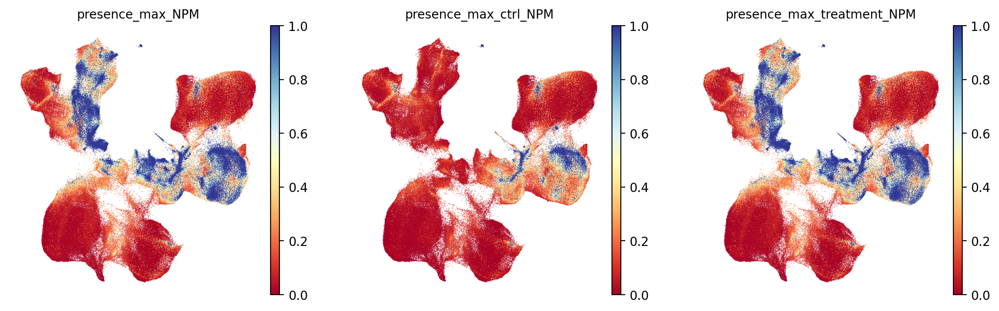

In [86]:
fig, ax = plt.subplots(1,3,figsize=(14,4))
sc.pl.embedding(braun, basis='X_umap_RG', color=['presence_max_NPM'], frameon=False, color_map='RdYlBu', ax=ax[0], show=False, size=0.8)
sc.pl.embedding(braun, basis='X_umap_RG', color=['presence_max_ctrl_NPM'], frameon=False, color_map='RdYlBu', ax=ax[1], show=False, size=0.8)
sc.pl.embedding(braun, basis='X_umap_RG', color=['presence_max_treatment_NPM'], frameon=False, color_map='RdYlBu', ax=ax[2], show=False, size=0.8)
plt.savefig(path_fig+'NPM_presence_score.png', dpi=300, format='png', bbox_inches='tight')
fig.show()


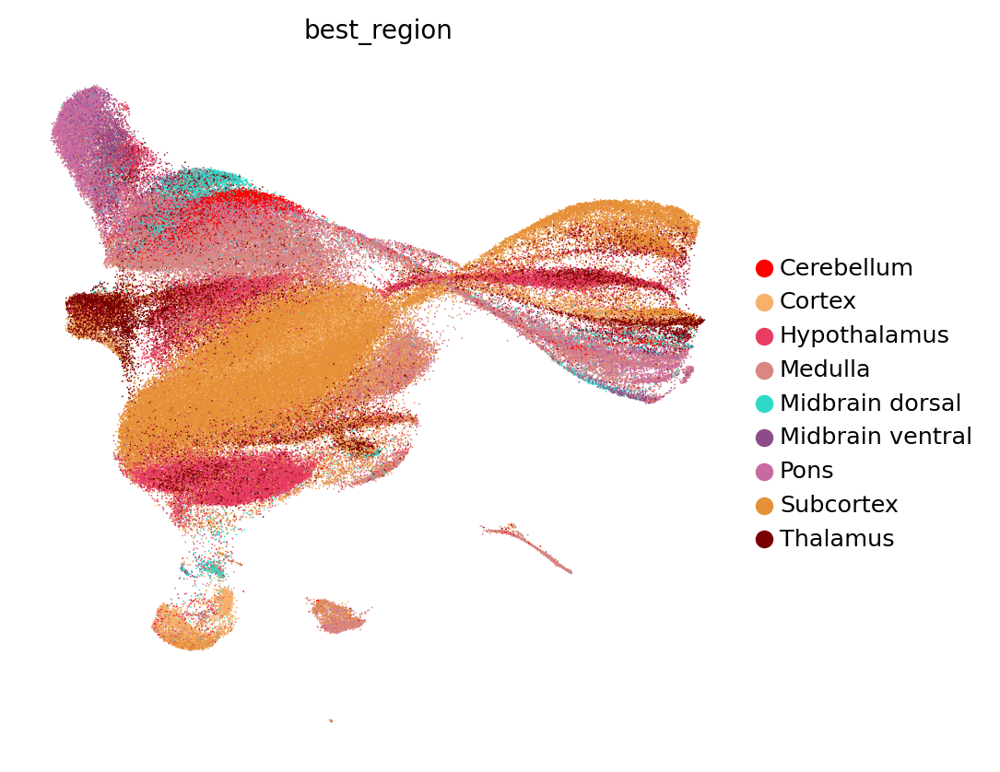

In [68]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.embedding(adata,basis = 'umap_rss', color=['best_region'] , 
                    s=1.5, frameon=False, ncols=1, palette=subregion_color, save='region_parse_Braun.png')

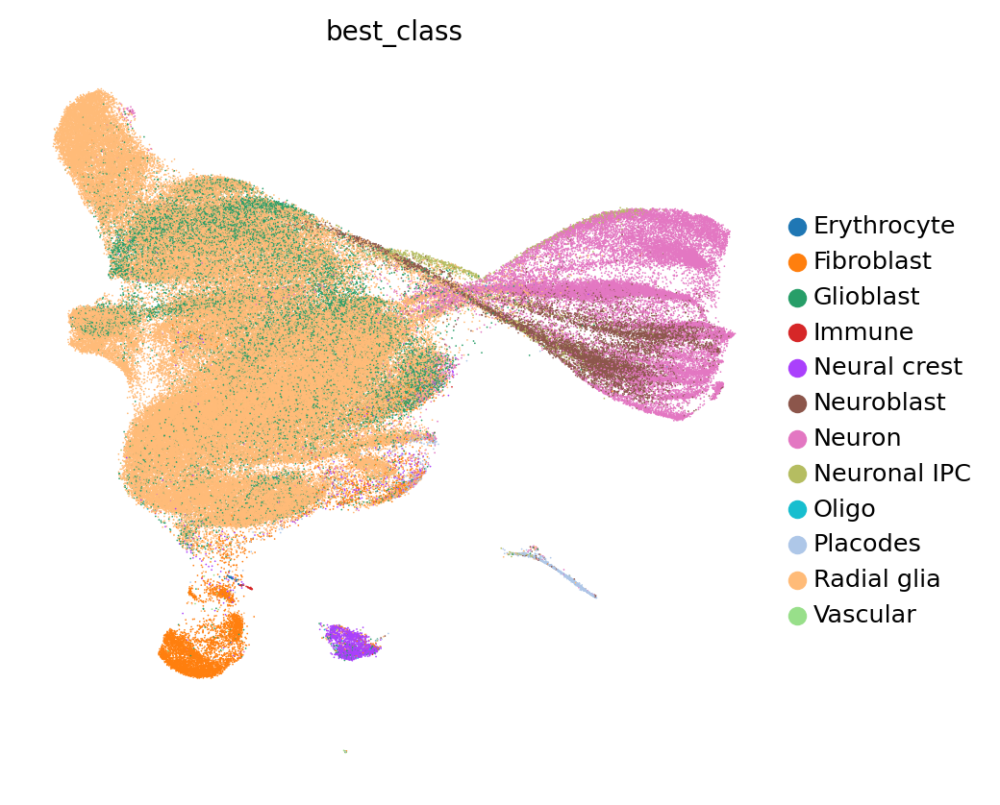

In [67]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.embedding(adata,basis = 'umap_rss', color=['best_class'] , 
                    s=1.5, frameon=False, ncols=2, save='class_parse_Braun.png' )

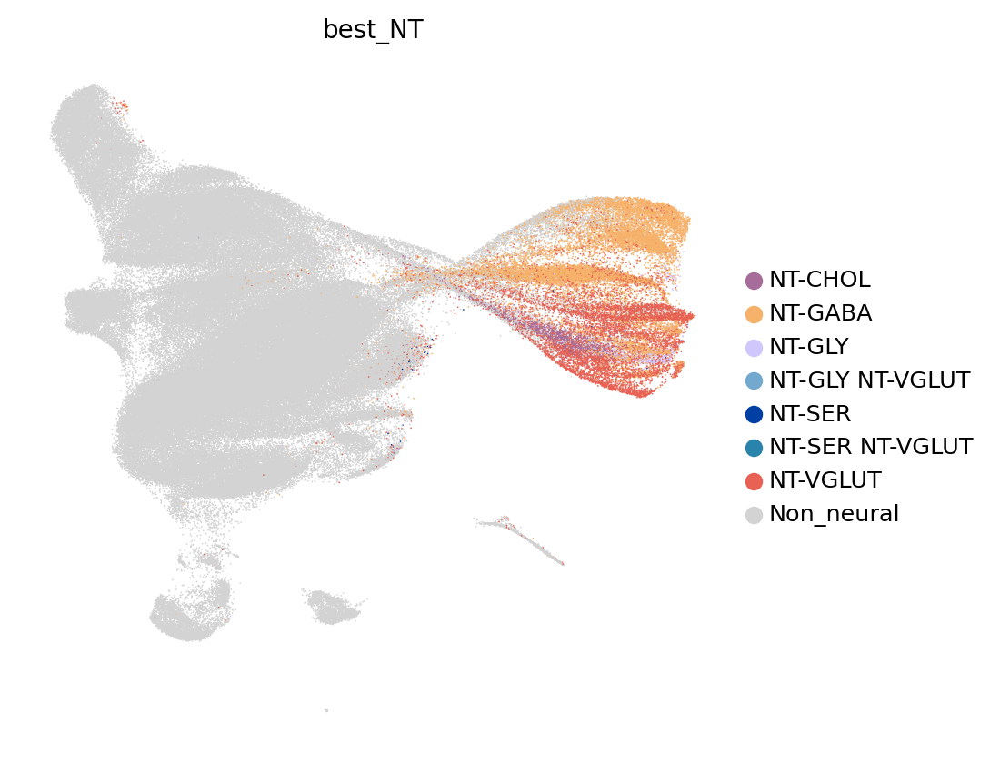

In [66]:
NT_dict={
    'Non_neural':'lightgray', 
    'NT-VGLUT':"#e76254", 
    'NT-GABA':'#f6b26b', 
    'NT-GLY':'#d0c7ff', 
    'NT-CHOL':'#a66d9b', 
    'NT-SER':'#023fa5', 
    'NT-SER NT-VGLUT':'#2983aa', 
    'NT-GLY NT-VGLUT':'#74a9cf'}


with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.embedding(adata,basis = 'umap_rss', color=['best_NT'] , 
                    s=1.5, frameon=False, ncols=1,palette=NT_dict, save='neuron_parse_Braun.png' )

In [59]:
adata.obs.best_NT.unique()

['Non_neural', 'NT-VGLUT', 'NT-GABA', 'NT-GLY', 'NT-CHOL', 'NT-SER', 'NT-SER NT-VGLUT', 'NT-GLY NT-VGLUT']
Categories (8, object): ['NT-CHOL', 'NT-GABA', 'NT-GLY', 'NT-GLY NT-VGLUT', 'NT-SER', 'NT-SER NT-VGLUT', 'NT-VGLUT', 'Non_neural']

# Patterning screen

In [ ]:
adata = sc.read_h5ad(Path(path_data)/"OSMGT.h5ad")
rss = pd.read_csv(Path(path_data)/"rss_OSMGT.tsv",
                 sep='\t')


In [ ]:
adata.obsm['rss'] = rss.values
metadata = pd.read_csv(Path(path_data)/"meta_OSMGT.tsv", sep='\t')
adata.obs['merged_cluster_annotation'] = metadata.merged_cluster_annotation
adata.obs['Condition'] = metadata.Condition
lat_rep_query = np.load(Path(path_data)/'mapping_braun_OSMGT_100/lat_rep_query.npy')
adata.obsm['X_scanvi_braun'] = lat_rep_query.copy()


In [78]:
wknn_q2r = wknn.get_wknn(ref = braun.obsm['X_scvi'],
                         query = adata.obsm['X_scanvi_braun'],
                         k = 50,
                         query2ref = True,
                         ref2query = False,
                         weighting_scheme = "jaccard_square")



presence_scores_ct = wknn.estimate_presence_score(ref_adata=braun,
                                                  query_adata=adata,
                                                  wknn = wknn_q2r,
                                                  k_wknn=50,
                                                  use_rep_ref_wknn = 'X_scvi',
                                                  use_rep_query_wknn = 'X_scanvi_braun',
                                                  split_by='Condition', 
                                                 )





braun.obs = pd.concat([braun.obs, presence_scores_ct['per_group']], axis=1)


Failed calling cuML. Falling back to neighborhood estimation using CPU with pynndescent
Failed calling cuML. Falling back to neighborhood estimation using CPU with pynndescent
[PROGRESS] Ref-ref transition matrix is not provided while random-walk is requested
[PROGRESS] Calculating ref-ref transition matrix...
[PROGRESS] Calculating presence scores...
[PROGRESS] Smoothing presence scores by random-walk...


In [80]:
braun.obs['presence_max_OSMGT_morphogen'] = presence_scores_ct['max']
import re
braun.obs['presence_max_OSMGT_ctrl'] = presence_scores_ct['per_group'].filter(regex='Control_').max(axis=1)

braun.obs['presence_max_OSMGT_treatment'] = presence_scores_ct['per_group'][np.setdiff1d(presence_scores_ct['per_group'].columns, 
                                                                                         presence_scores_ct['per_group'].filter(regex='Control_').columns)].max(axis=1)

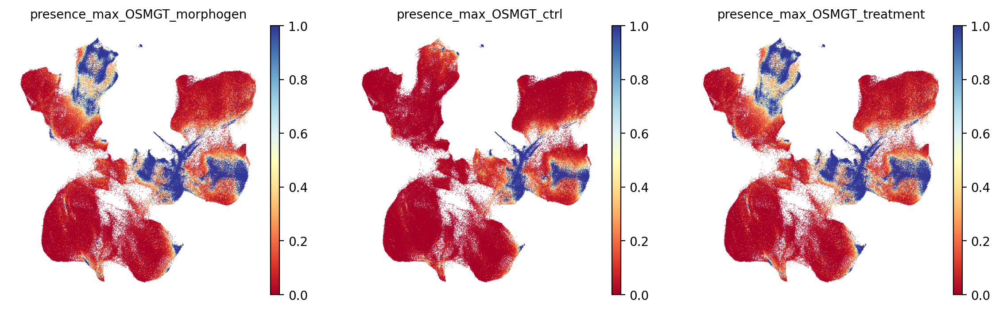

In [85]:
fig, ax = plt.subplots(1,3,figsize=(14,4))
sc.pl.embedding(braun, basis='X_umap_RG', color=['presence_max_OSMGT_morphogen'], frameon=False, color_map='RdYlBu', ax=ax[0], show=False, size=0.8)
sc.pl.embedding(braun, basis='X_umap_RG', color=['presence_max_OSMGT_ctrl'], frameon=False, color_map='RdYlBu', ax=ax[1], show=False, size=0.8)
sc.pl.embedding(braun, basis='X_umap_RG', color=['presence_max_OSMGT_treatment'], frameon=False, color_map='RdYlBu', ax=ax[2], show=False, size=0.8)
plt.savefig(path_fig+'OSMGT_presence_score.png', dpi=300, format='png', bbox_inches='tight')
fig.show()


# Best labels

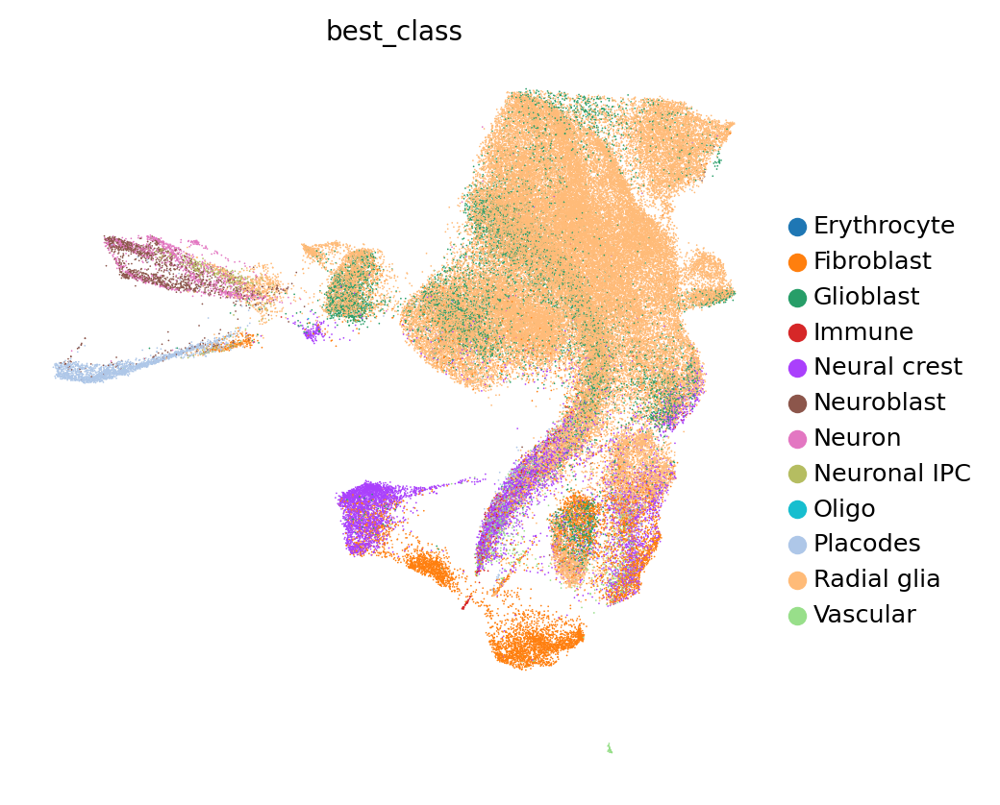

In [99]:
umap = pd.read_csv(Path(path_data)/"OSMGT_umap.tsv",
                 sep='\t')
adata.obsm['X_umap'] = umap.values

label = pd.read_csv(path_data+'mapping_braun_OSMGT_100/label_transfer_class.tsv', sep = '\t')
label.index = label['Unnamed: 0']
adata.obs['best_class'] = label['best_label']
adata.obs['best_score_class'] = label['best_score']

with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.embedding(adata,basis = 'X_umap', color=['best_class'] , s=1.5, frameon=False, ncols=1,save='class_OSMGT_Braun.png')

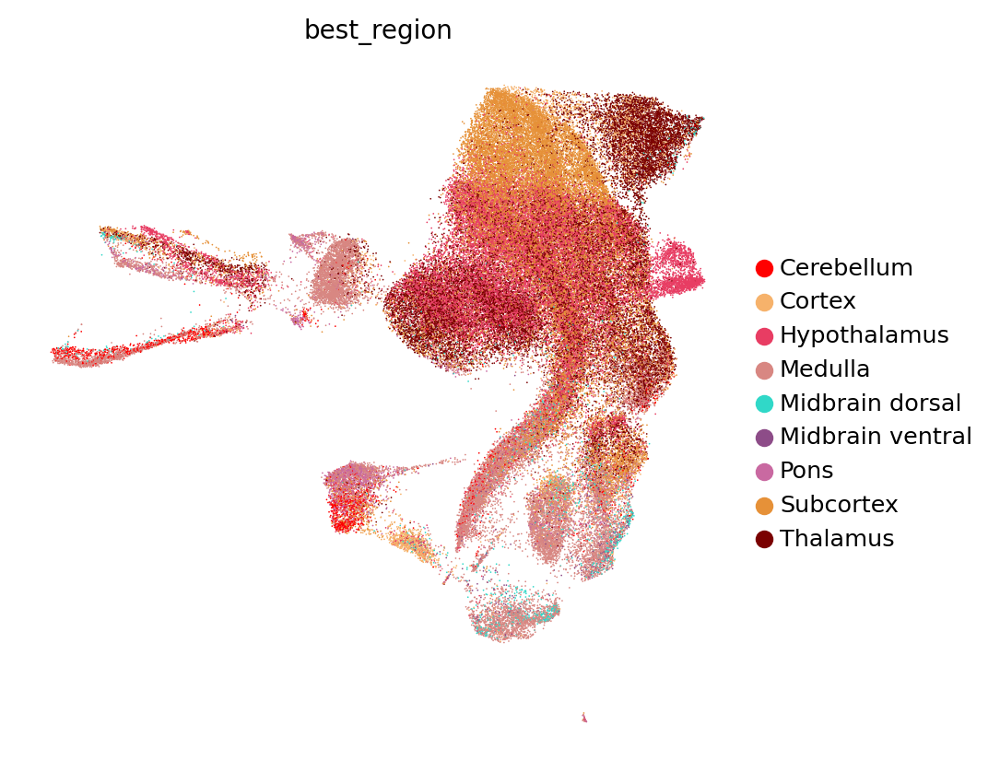

In [100]:
label = pd.read_csv(path_data+'mapping_braun_OSMGT_100/label_transfer_region_hier.tsv', sep = '\t')
label.index = label['Unnamed: 0']
label = label.rename(columns={'0':'best_label'})
adata.obs['best_region'] = label['best_label']

with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.embedding(adata,basis = 'X_umap', color=['best_region'] , s=1.5, frameon=False, 
                    palette=subregion_color,
                    ncols=1,save='region_OSMGT_Braun.png')

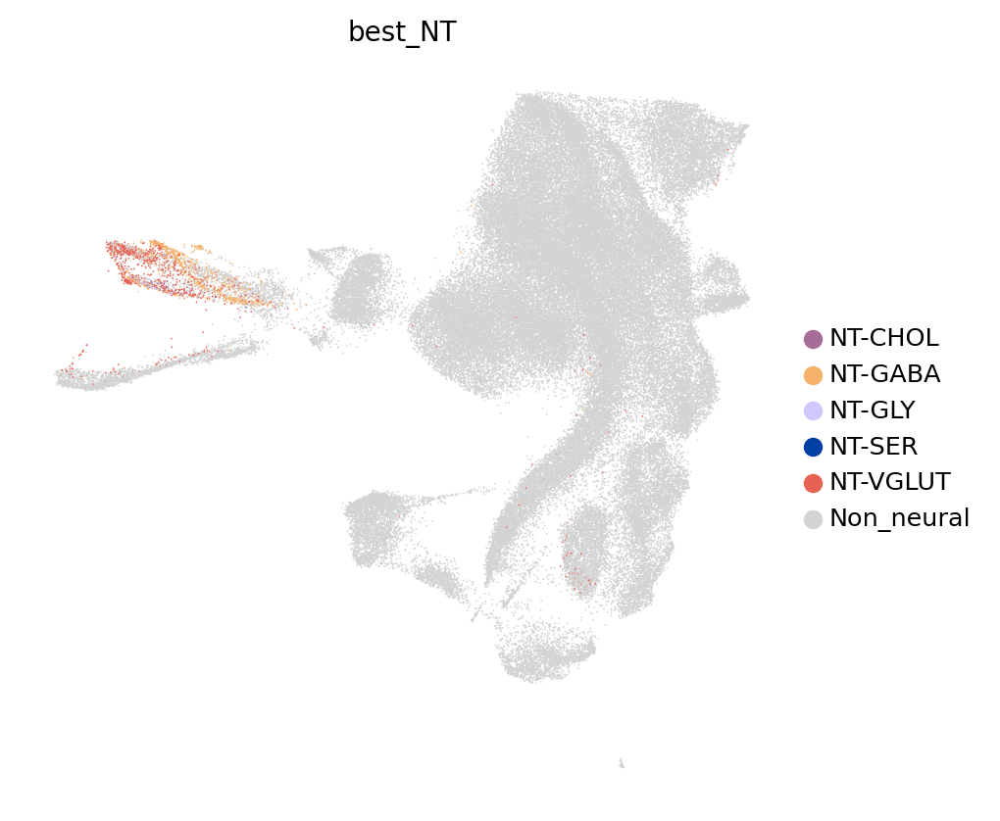

In [101]:

label = pd.read_csv(path_data+'mapping_braun_OSMGT_100/label_transfer_NTT.tsv', sep = '\t')
label.index = label['Unnamed: 0']
label = label.rename({'Unnamed: 1':'Non_neural'}, axis=1)
label['best_label']  = label['best_label'].fillna('Non_neural')
adata.obs['best_NT'] = label['best_label']
adata.obs['best_score_NT'] = label['best_score']

with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.embedding(adata,basis = 'X_umap', color=['best_NT'] , s=1.5, frameon=False, 
                     palette=NT_dict,
                    ncols=1,save='neuron_OSMGT_Braun.png')

In [102]:
braun.obs.to_csv("/links/groups/treutlein/USERS/nazbukina/fatima_revision/data/braun_RG_projections.tsv",
                 sep='\t', index=None)

In [106]:
#adata.var.set_index('_index',inplace=True)
#adata.var.index.name = None
#adata.var



ValueError: '_index' is a reserved name for dataframe columns.

In [108]:
adata.raw.var.set_index('_index',inplace=True)
adata.raw.var.index.name = None

adata.write_h5ad('/links/groups/treutlein/USERS/nazbukina/fatima_revision/data/OSMGT_v1.h5ad')

# AGE

In [8]:
umap = pd.read_csv("/links/groups/treutlein/USERS/nazbukina/fatima_revision/data/braun_RG_umap.tsv", sep='\t')
braun.obsm['X_umap_RG'] = umap.values

#braun.obs['Age'] = braun.obs['Age'].round(1).astype(str)

In [2]:
meta=pd.read_csv("/links/groups/treutlein/USERS/nazbukina/fatima_revision/data/braun_RG_projections.tsv",
                 sep='\t')
meta.head()

,Age,CellClass,CellCycleFraction,CellID,Chemistry,Clusters,Donor,DoubletFlag,DoubletScore,Region,...,FGF8_late_D,FGF8_late_A,FGF8_late_E,FGF8_late_B,FGF8_late_C,CycA_E_FGF8_A,Control_SMOG1,presence_max_OSMGT_morphogen,presence_max_OSMGT_ctrl,presence_max_OSMGT_treatment
0,8.0,Radial glia,0.007332,10X89_1:AAAGTAGAGACCTTTG,v2,227.0,BRC2006,0,0.02,Telencephalon,...,0.001884,0.001517,0.001804,0.001684,0.001630,0.000997,0.001596,0.004809,0.004800,0.004809
1,8.0,Radial glia,0.004778,10X89_1:AACCATGGTCACTTCC,v2,227.0,BRC2006,0,0.01,Telencephalon,...,0.001730,0.001735,0.002324,0.001885,0.001969,0.001160,0.001791,0.010487,0.004772,0.010487
2,8.0,Radial glia,0.007248,10X89_1:AAGACCTGTGCGGTAA,v2,227.0,BRC2006,0,0.03,Telencephalon,...,0.001205,0.001162,0.001325,0.001274,0.001161,0.000723,0.001182,0.003607,0.003607,0.003511
3,8.0,Radial glia,0.003004,10X89_1:ACACCAAAGATGCCTT,v2,227.0,BRC2006,0,0.02,Telencephalon,...,0.002162,0.002267,0.002506,0.002664,0.002189,0.001707,0.002554,0.008725,0.006418,0.008725
4,8.0,Radial glia,0.005533,10X89_1:ACACTGACATCAGTAC,v2,227.0,BRC2006,0,0.07,Telencephalon,...,0.001770,0.001834,0.002804,0.001929,0.002189,0.001347,0.001882,0.013402,0.004517,0.013402


In [3]:
meta = meta.set_index('CellID')
meta.index.name=None
meta.head()

,Age,CellClass,CellCycleFraction,Chemistry,Clusters,Donor,DoubletFlag,DoubletScore,Region,SampleID,...,FGF8_late_D,FGF8_late_A,FGF8_late_E,FGF8_late_B,FGF8_late_C,CycA_E_FGF8_A,Control_SMOG1,presence_max_OSMGT_morphogen,presence_max_OSMGT_ctrl,presence_max_OSMGT_treatment
10X89_1:AAAGTAGAGACCTTTG,8.0,Radial glia,0.007332,v2,227.0,BRC2006,0,0.02,Telencephalon,10X89_1,...,0.001884,0.001517,0.001804,0.001684,0.001630,0.000997,0.001596,0.004809,0.004800,0.004809
10X89_1:AACCATGGTCACTTCC,8.0,Radial glia,0.004778,v2,227.0,BRC2006,0,0.01,Telencephalon,10X89_1,...,0.001730,0.001735,0.002324,0.001885,0.001969,0.001160,0.001791,0.010487,0.004772,0.010487
10X89_1:AAGACCTGTGCGGTAA,8.0,Radial glia,0.007248,v2,227.0,BRC2006,0,0.03,Telencephalon,10X89_1,...,0.001205,0.001162,0.001325,0.001274,0.001161,0.000723,0.001182,0.003607,0.003607,0.003511
10X89_1:ACACCAAAGATGCCTT,8.0,Radial glia,0.003004,v2,227.0,BRC2006,0,0.02,Telencephalon,10X89_1,...,0.002162,0.002267,0.002506,0.002664,0.002189,0.001707,0.002554,0.008725,0.006418,0.008725
10X89_1:ACACTGACATCAGTAC,8.0,Radial glia,0.005533,v2,227.0,BRC2006,0,0.07,Telencephalon,10X89_1,...,0.001770,0.001834,0.002804,0.001929,0.002189,0.001347,0.001882,0.013402,0.004517,0.013402


In [12]:
braun.obs = meta.copy()

In [15]:
braun.obs['Age'] = braun.obs['Age'].round(1).astype(str)

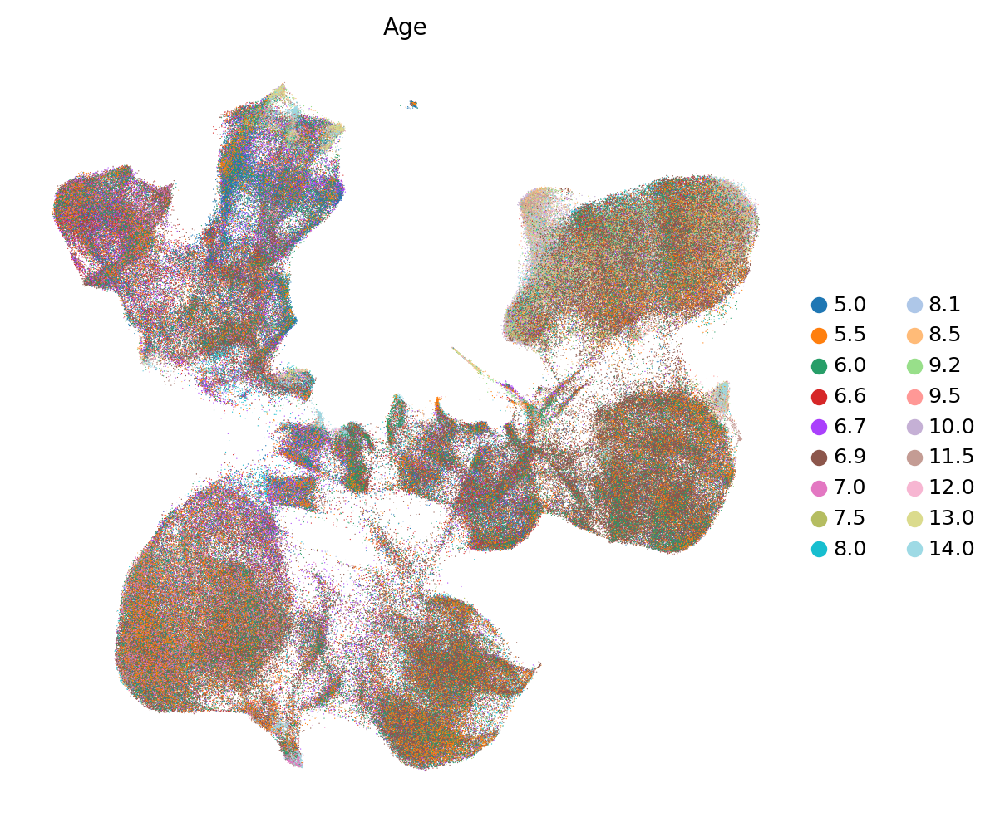

In [16]:
with plt.rc_context({'figure.figsize' : (6,6)}):
    sc.pl.embedding(braun, basis='X_umap_RG', color=[ 'Age'
                                                  ], frameon=False,ncols=2, s=0.8)


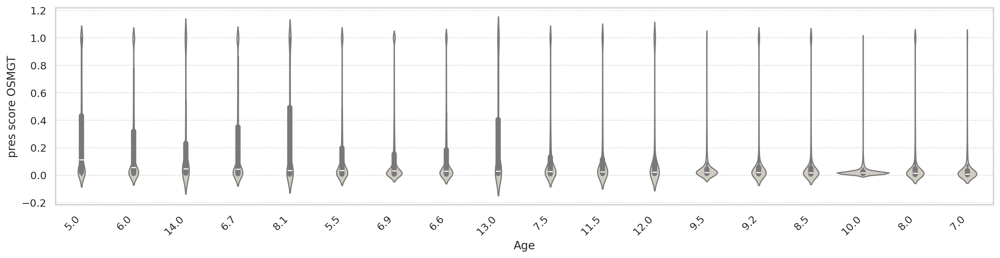

In [17]:
sns.set(rc={'figure.figsize':(15,4)})
sns.set_style("whitegrid", { "grid.linestyle": ":"})
my_order = braun.obs[['Age','presence_max_OSMGT_morphogen']].groupby(by=["Age"])["presence_max_OSMGT_morphogen"].median().sort_values().iloc[::-1].index
plot = sns.violinplot(data=braun.obs, y='presence_max_OSMGT_morphogen', x = 'Age',  order=my_order, 
                      color="#D3CDBF", inner = "box",
                     width=1)

plot.set_xticklabels(plot.get_xticklabels(), rotation=45,
                        horizontalalignment='right')

plt.ylabel('pres score OSMGT')

plt.tight_layout()

#plt.savefig(path_fig+'Conditions_reproducibility_mmd_neural_only.pdf', dpi=300)
plt.show()


In [ ]:
braun.obs[['Age', 'Subregion2']].value_counts()

In [ ]:
braun

In [5]:
meta['Age'] = meta['Age'].round(1).astype(str)


In [10]:
meta[meta['Age']=='7.5']['Subregion2'].unique()

array(['Forebrain'], dtype=object)

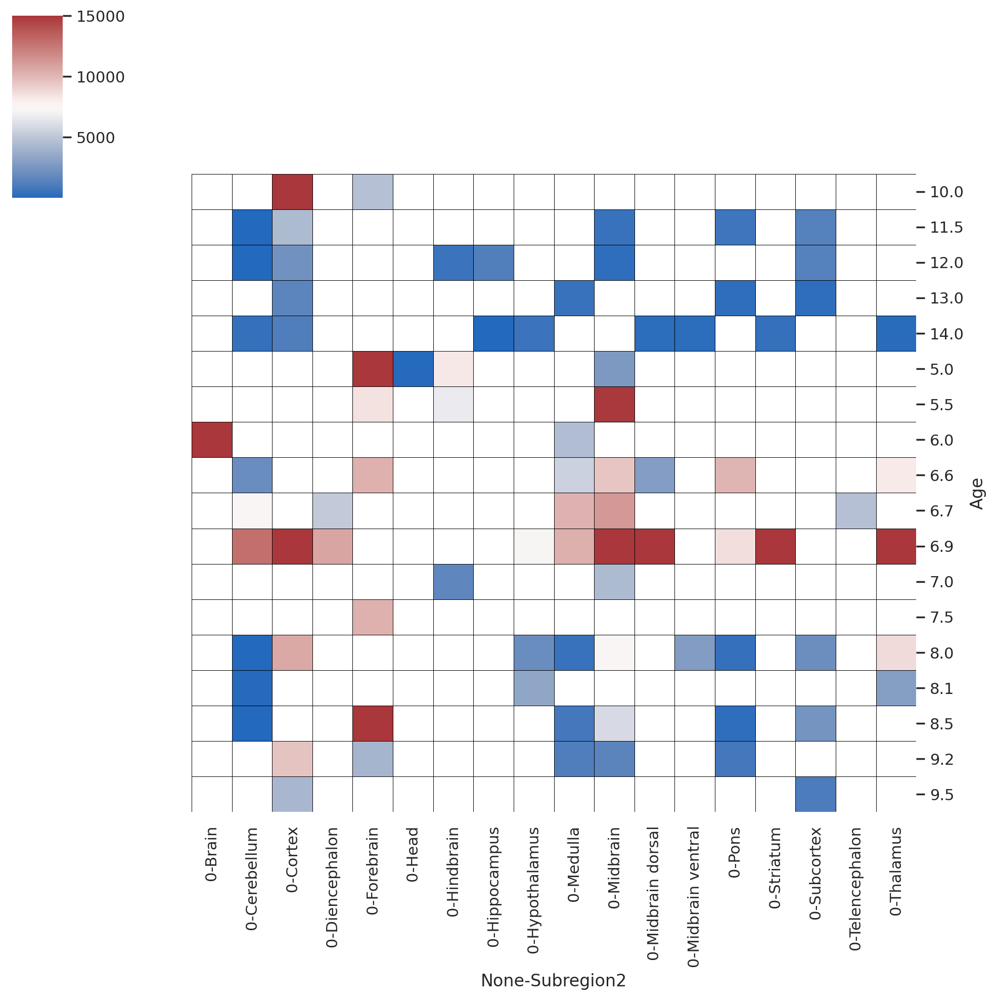

In [14]:
sns.set(rc={'figure.figsize':(10,10)})
sns.set_style("white")

sns.clustermap(pd.DataFrame(meta[['Age','Subregion2']].value_counts()).reset_index().pivot(index='Age', columns='Subregion2'), row_cluster=False, col_cluster=False,
               linewidths=0.2, linecolor="black", cmap="vlag", vmax=15000)

In [8]:
pd.DataFrame(meta[['Age','Subregion2']].value_counts())

0
Age  Subregion2        
6.0  Brain        42561
6.9  Striatum     40560
     Cortex       26016
     Thalamus     22803
     Midbrain     22645
...                 ...
14.0 Hippocampus     50
8.5  Cerebellum      43
8.0  Cerebellum      26
12.0 Cerebellum      10
11.5 Cerebellum       6

[84 rows x 1 columns]